# Восстановление золота из руды

Подготовьте прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Используйте данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Вам нужно:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

Чтобы выполнить проект, обращайтесь к библиотекам *pandas*, *matplotlib* и *sklearn.* Вам поможет их документация.

***
1. *Конечный результат должен иметь вид: модель, которая предсказывает коэффициент восстановления золота из золотосодержащей руды (итоговой sMAPE – конечный признак, должен быть точным).*

2. *Задача выполняется для:
    2.1 обучения на реальном примере анализу данных в бизнесе.
    2.2 улучшения эффективности производства.*

3. *Данные уже даны.*

4. *Дальнейшие шаги описаны в чек-листе.*
***

## Подготовка данных

In [4]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

#импорт библиотек
import pandas as pd
import seaborn as sns
import pandas_profiling
import matplotlib.pyplot as plt
import numpy as np
from numpy import arange
from sklearn.metrics import mean_absolute_error
from scipy.stats import ks_2samp
from scipy import stats as st

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.dummy import DummyRegressor

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.impute import KNNImputer

from sklearn.metrics import make_scorer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [5]:
#открыть и изучить данные
df_train = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_train_new.csv')
df_test = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_test_new.csv')
df_full = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_full_new.csv')


df_train['date'] = pd.to_datetime(df_train['date'], format='%Y-%m-%d %H:%M:%S')
df_test['date'] = pd.to_datetime(df_test['date'], format='%Y-%m-%d %H:%M:%S')
df_full['date'] = pd.to_datetime(df_full['date'], format='%Y-%m-%d %H:%M:%S')

In [6]:
display(df_train.profile_report(minimal=True), df_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14149 entries, 0 to 14148
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                14149 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         14148 non-null  float64       
 2   final.output.concentrate_pb                         14148 non-null  float64       
 3   final.output.concentrate_sol                        13938 non-null  float64       
 4   final.output.concentrate_au                         14149 non-null  float64       
 5   final.output.recovery                               14149 non-null  float64       
 6   final.output.tail_ag                                14149 non-null  float64       
 7   final.output.tail_pb                                14049 non-null  float64       
 8   final.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

None

In [7]:
display(df_test.profile_report(minimal=True), df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5290 entries, 0 to 5289
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   date                                        5290 non-null   datetime64[ns]
 1   primary_cleaner.input.sulfate               5286 non-null   float64       
 2   primary_cleaner.input.depressant            5285 non-null   float64       
 3   primary_cleaner.input.feed_size             5290 non-null   float64       
 4   primary_cleaner.input.xanthate              5286 non-null   float64       
 5   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64       
 6   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64       
 7   primary_cleaner.state.floatbank8_b_air      5290 non-null   float64       
 8   primary_cleaner.state.floatbank8_b_level    5290 non-null   float64       
 9   primary_

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

None

In [8]:
display(df_full.profile_report(minimal=True), df_full.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                19439 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         19438 non-null  float64       
 2   final.output.concentrate_pb                         19438 non-null  float64       
 3   final.output.concentrate_sol                        19228 non-null  float64       
 4   final.output.concentrate_au                         19439 non-null  float64       
 5   final.output.recovery                               19439 non-null  float64       
 6   final.output.tail_ag                                19438 non-null  float64       
 7   final.output.tail_pb                                19338 non-null  float64       
 8   final.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

None

In [9]:
#формула обогащения 
#c — доля золота в концентрате после флотации/очистки;
#f — доля золота в сырье/концентрате до флотации/очистки;
#t — доля золота в отвальных хвостах после флотации/очистки.
def recovery (c, f, t):
    r_value = ((c*(f-t)) / (f*(c-t))) * 100
    return r_value 

In [10]:
recovery_data = []
recovery_data = recovery(df_train['rougher.output.concentrate_au'], 
                         df_train['rougher.input.feed_au'], 
                         df_train['rougher.output.tail_au'])

mae_recovery = mean_absolute_error(recovery_data, df_train['rougher.output.recovery'])
mae_recovery

9.73512347450521e-15

**Вывод:**

1.2: Эффективность обогащения посчитана верно, средняя ошибка сильно меньше 1.

1.3: В тестовом наборе данных нет колонок, показывающих содержание веществ после прохождения этапов очистки.

1.4: Дата переведена в соответствующий тип данных. Пропусков не более 5%, в основном – в концентрации побочных продуктов в отвальных хвостах. Пока что не вижу смысла трогать пропуски.

## Анализ данных

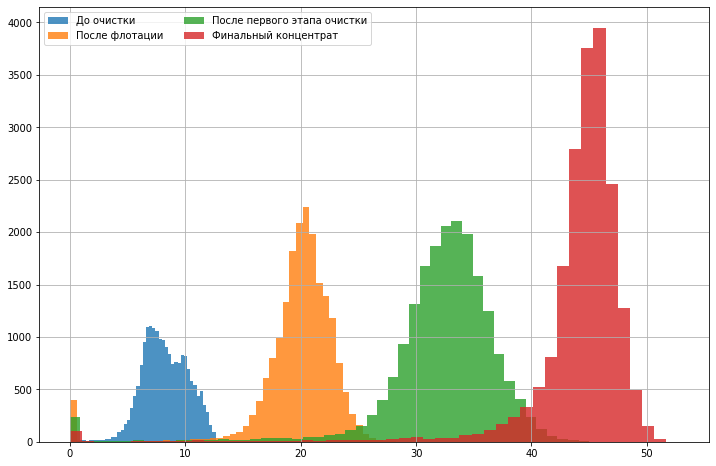

In [11]:
sns.color_palette("light:#5A9", as_cmap=True)
#изменения в концентрации золота

df_full['rougher.input.feed_au'].hist(bins=50, alpha=0.8)

df_full['rougher.output.concentrate_au'].hist(bins=50, alpha=0.8)

df_full['primary_cleaner.output.concentrate_au'].hist(bins=50, alpha=0.8)

df_full['final.output.concentrate_au'].hist(bins=50, figsize=(12,8), alpha=0.8)
plt.legend(('До очистки', 'После флотации', 'После первого этапа очистки', 'Финальный концентрат'), 
           ncol=2, 
           loc='upper left')
plt.show()

Как видно из сравнения гистограм, с каждым новым этапом очистки увеличивается процент золота в очищаемой смеси.

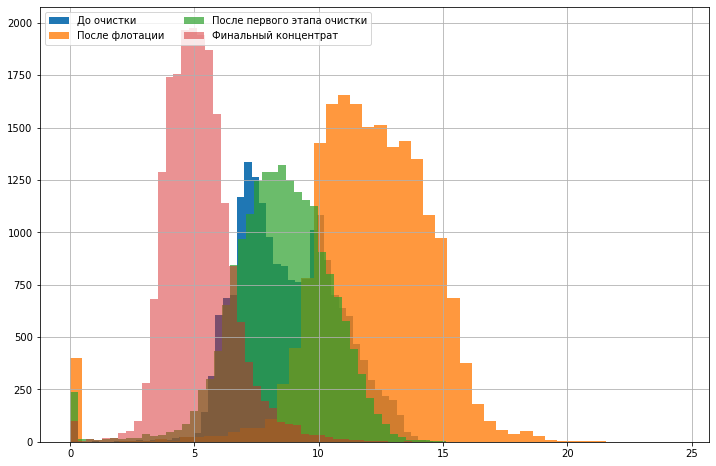

In [12]:
#изменение концентрации серебра

df_full['rougher.input.feed_ag'].hist(bins=50, alpha=1)

df_full['rougher.output.concentrate_ag'].hist(bins=50, alpha=0.8)

df_full['primary_cleaner.output.concentrate_ag'].hist(bins=50, alpha=0.7)

df_full['final.output.concentrate_ag'].hist(bins=50, figsize=(12,8), alpha=0.5)
plt.legend(('До очистки', 'После флотации', 'После первого этапа очистки', 'Финальный концентрат'), 
           ncol=2, 
           loc='upper left')

После двух этапов очистки концентрация серебра значительно уменьшается, так как это побочный продукт, который не нужен в конечной смеси.

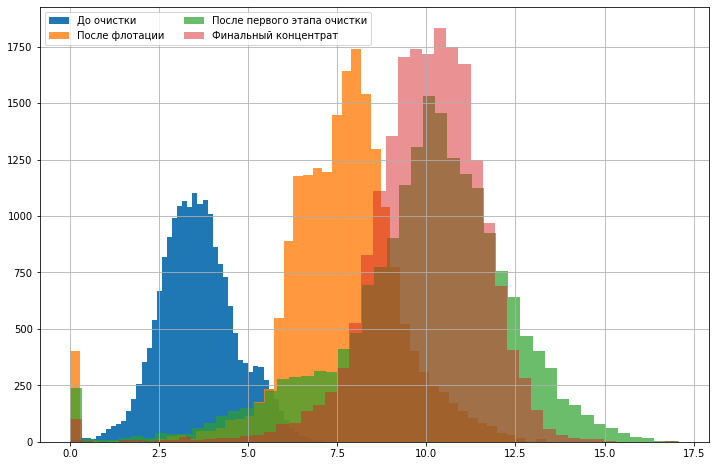

In [13]:
#изменение концентрации свинца

df_full['rougher.input.feed_pb'].hist(bins=50, alpha=1)

df_full['rougher.output.concentrate_pb'].hist(bins=50, alpha=0.8)

df_full['primary_cleaner.output.concentrate_pb'].hist(bins=50, alpha=0.7)

df_full['final.output.concentrate_pb'].hist(bins=50, figsize=(12,8), alpha=0.5)
plt.legend(('До очистки', 'После флотации', 'После первого этапа очистки', 'Финальный концентрат'), 
           ncol=2, 
           loc='upper left')

Судя по процентному содержаню свинца в образцах, специально его из состава не убирают. Концентрация растет с каждым этапом очистки.

KstestResult(statistic=0.2505820112464947, pvalue=1.692354628798114e-213)
Ttest_indResult(statistic=nan, pvalue=nan)


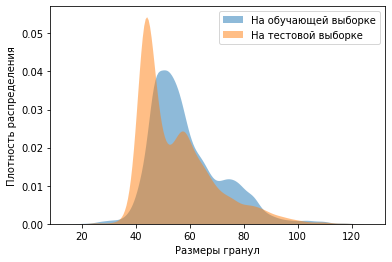

In [14]:
# разница распределения размеров гранул сырья на обучающей и тестовой выборках

sns.kdeplot(df_train[(df_train['rougher.input.feed_size'] < 120) & (df_train['rougher.input.feed_size'] > 20)]['rougher.input.feed_size'], fill=True, common_norm=False,
   alpha=.5, linewidth=0)
sns.kdeplot(df_test[(df_test['rougher.input.feed_size'] < 120) & (df_test['rougher.input.feed_size'] > 20)]['rougher.input.feed_size'], fill=True, common_norm=False,
   alpha=.5, linewidth=0)

plt.legend(labels=['На обучающей выборке', 'На тестовой выборке'])
plt.xlabel('Размеры гранул')
plt.ylabel('Плотность распределения')
sns.set(rc={'figure.figsize':(12,8)})

print(ks_2samp(df_train['rougher.input.feed_size'], df_test['rougher.input.feed_size']))
print(st.ttest_ind(df_train['rougher.input.feed_size'], df_test['rougher.input.feed_size']))

Распределения отличаются друг от друга, но не сильно. Данные подойдут для обучения моделей.

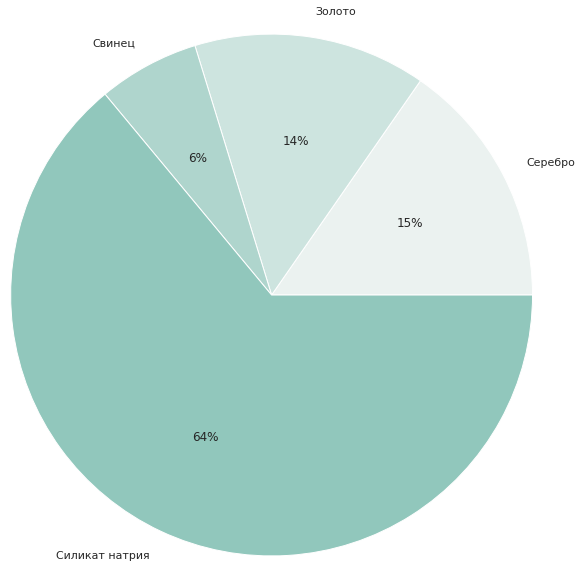

In [15]:
#суммарная концентрация всех веществ на разных стадиях: в сырье

df_rougher = df_full[['rougher.input.feed_ag', 
                     'rougher.input.feed_au', 
                     'rougher.input.feed_pb', 
                     'rougher.input.feed_sol']]

colors = sns.color_palette('light:#5A9')
labels = ['Серебро', 'Золото', 'Свинец', 'Силикат натрия']
plt.pie(df_rougher.mean(), labels = labels, colors = colors, autopct='%.0f%%', radius=1.5)
plt.show()

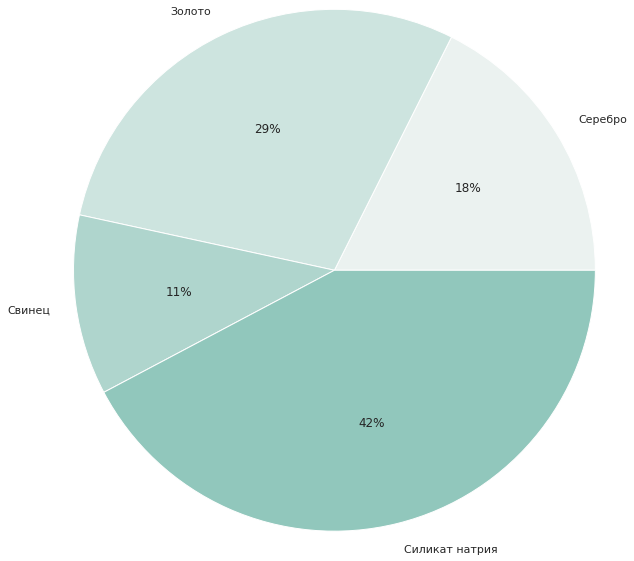

In [16]:
#в черновом

df_rprocess = df_full[['rougher.output.concentrate_ag', 
                      'rougher.output.concentrate_au', 
                      'rougher.output.concentrate_pb', 
                      'rougher.output.concentrate_sol']]

colors = sns.color_palette('light:#5A9')
labels = ['Серебро', 
          'Золото', 
          'Свинец', 
          'Силикат натрия', 
          ]
plt.pie(df_rprocess.mean(), labels = labels, colors = colors, autopct='%.0f%%', radius=1.5)
plt.show()

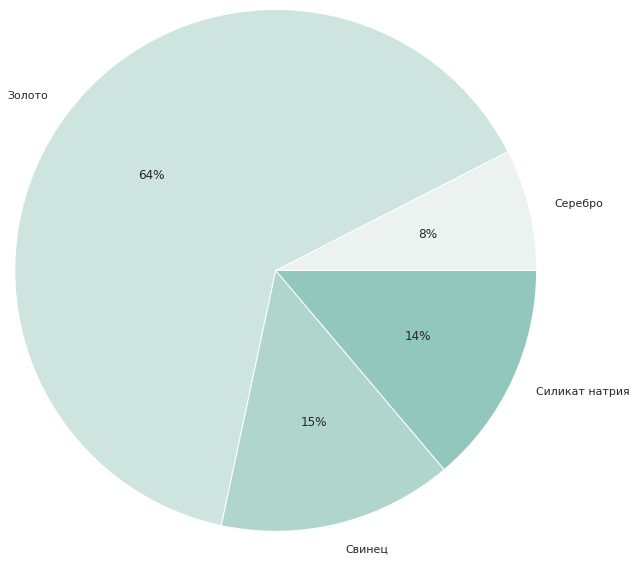

68.72510242280688

In [17]:
#в финальном

df_final = df_full[['final.output.concentrate_ag',
                    'final.output.concentrate_au',
                    'final.output.concentrate_pb',
                    'final.output.concentrate_sol']]

colors = sns.color_palette('light:#5A9')
labels = ['Серебро', 
          'Золото', 
          'Свинец', 
          'Силикат натрия']
plt.pie(df_final.mean(), labels = labels, colors = colors, autopct='%.0f%%', radius=1.5)
plt.show()
df_final.mean().sum()

**Вывод:** процесс действительно работает на то, чтобы увеличивать долю золота в концентрате и уменьшать доли примесей. Доля золота увеличивается с 9 до 47% в среднем. Однако часть золота также уходит в "хвосты" – выходит из цикла, попадая в технологический мусор. При этом также увеличивается доля свинца – он не отсеивается процессом фильтрации. Доля серебра на последнем этапе уменьшается – большая часть серебра уходит в отвальные хвосты. Силикат натрия, как депрессант, расходуется в процессе удаления хвостов.

<div class="alert alert-info"> 
    <h4>Исправленный вывод:</h4>

Процесс действительно работает на то, чтобы увеличивать долю золота в концентрате и уменьшать доли примесей. Доля золота увеличивается с 14 до 64% в среднем. Однако часть золота также уходит в "хвосты" – выходит из цикла, попадая в технологический мусор. При этом также увеличивается доля свинца – он не отсеивается процессом фильтрации. Доля серебра на последнем этапе уменьшается – большая часть серебра уходит в отвальные хвосты. Силикат натрия, как депрессант, расходуется в процессе удаления хвостов.
    
На последнем графике визуально заметна динамика – концентрация золота растет, концентрация примесей снижается.

## Модель

In [ ]:
RANDOM_STATE=np.random.RandomState(12345)

#функция для подсчета sMAPE
def sMAPE(control, prediction):
    result_1 = ((((abs(control - prediction)) / ((abs(control) + abs(prediction)) / 2)).sum()) / len(prediction))*100
    return result_1

#функция для итоговой sMAPE
def fsMAPE(result_rougher, result_final):
    result = (0.25 * result_rougher) + (0.75 * result_final)
    return result

Перед нами задача регрессии – подойдут или решающее дерево/случайный лес, или линейная регрессия.

In [ ]:
#выделяем таргеты для train
df_train_target_final = df_train['final.output.recovery']
df_train_target_rougher = df_train['rougher.output.recovery']

#выделяем таргеты для test
df_test_target = df_test.merge(df_full[['date', 'final.output.recovery', 'rougher.output.recovery']], 
                               on='date', 
                               how='left')
df_test_target_final = df_test_target['final.output.recovery']
df_test_target_rougher = df_test_target['rougher.output.recovery']

In [ ]:
#учитывая, что предикт должен быть построен на данных, 
#имеющихся только в тестовой выборке, для обучения неодходмо 
#очистить df_train от ненужных нам признаков

columns_for_training_rougher = ['rougher.input.feed_ag',
                                'rougher.input.feed_pb',
                                'rougher.input.feed_rate',
                                'rougher.input.feed_size',
                                'rougher.input.feed_sol',
                                'rougher.input.feed_au',
                                'rougher.input.floatbank10_sulfate',
                                'rougher.input.floatbank10_xanthate',
                                'rougher.input.floatbank11_sulfate',
                                'rougher.input.floatbank11_xanthate',
                                'rougher.state.floatbank10_a_air',
                                'rougher.state.floatbank10_a_level',
                                'rougher.state.floatbank10_b_air',
                                'rougher.state.floatbank10_b_level',
                                'rougher.state.floatbank10_c_air',
                                'rougher.state.floatbank10_c_level',
                                'rougher.state.floatbank10_d_air',
                                'rougher.state.floatbank10_d_level',
                                'rougher.state.floatbank10_e_air',
                                'rougher.state.floatbank10_e_level',
                                'rougher.state.floatbank10_f_air',
                                'rougher.state.floatbank10_f_level']

columns_for_training_final = ['primary_cleaner.input.sulfate',
                              'primary_cleaner.input.depressant',
                              'primary_cleaner.input.feed_size',
                              'primary_cleaner.input.xanthate',
                              'primary_cleaner.state.floatbank8_a_air',
                              'primary_cleaner.state.floatbank8_a_level',
                              'primary_cleaner.state.floatbank8_b_air',
                              'primary_cleaner.state.floatbank8_b_level',
                              'primary_cleaner.state.floatbank8_c_air',
                              'primary_cleaner.state.floatbank8_c_level',
                              'primary_cleaner.state.floatbank8_d_air',
                              'primary_cleaner.state.floatbank8_d_level',
                              'secondary_cleaner.state.floatbank2_a_air',
                              'secondary_cleaner.state.floatbank2_a_level',
                              'secondary_cleaner.state.floatbank2_b_air',
                              'secondary_cleaner.state.floatbank2_b_level',
                              'secondary_cleaner.state.floatbank3_a_air',
                              'secondary_cleaner.state.floatbank3_a_level',
                              'secondary_cleaner.state.floatbank3_b_air',
                              'secondary_cleaner.state.floatbank3_b_level',
                              'secondary_cleaner.state.floatbank4_a_air',
                              'secondary_cleaner.state.floatbank4_a_level',
                              'secondary_cleaner.state.floatbank4_b_air',
                              'secondary_cleaner.state.floatbank4_b_level',
                              'secondary_cleaner.state.floatbank5_a_air',
                              'secondary_cleaner.state.floatbank5_a_level',
                              'secondary_cleaner.state.floatbank5_b_air',
                              'secondary_cleaner.state.floatbank5_b_level',
                              'secondary_cleaner.state.floatbank6_a_air',
                              'secondary_cleaner.state.floatbank6_a_level'
                             ]

df_train_features_rougher = df_train[columns_for_training_rougher]
df_train_features_final = df_train[columns_for_training_final]
df_test_rougher = df_test[columns_for_training_rougher]
df_test_final = df_test.drop(columns=columns_for_training_rougher)
df_test_final = df_test_final.drop(columns='date')

In [ ]:
#избавляемся от пропусков

imputer = KNNImputer(weights='distance')
df_train_features_rougher = pd.DataFrame(imputer.fit_transform(df_train_features_rougher), 
                                         columns=df_train_features_rougher.columns)
df_train_features_final = pd.DataFrame(imputer.fit_transform(df_train_features_final), 
                                         columns=df_train_features_final.columns)
df_test_rougher = pd.DataFrame(imputer.fit_transform(df_test_rougher), 
                                         columns=df_test_rougher.columns)
df_test_final = pd.DataFrame(imputer.fit_transform(df_test_final), 
                                         columns=df_test_final.columns)

In [ ]:
#стандартизация

scaler = StandardScaler()
df_train_features_rougher = pd.DataFrame(scaler.fit_transform(df_train_features_rougher), columns=df_train_features_rougher.columns)
df_train_features_final = pd.DataFrame(scaler.fit_transform(df_train_features_final), columns=df_train_features_final.columns)

df_test_rougher = pd.DataFrame(scaler.fit_transform(df_test_rougher), columns=df_test_rougher.columns)
df_test_final = pd.DataFrame(scaler.fit_transform(df_test_final), columns=df_test_final.columns)

In [ ]:
df_train_features_rougher.profile_report()

In [ ]:
df_train_features_rougher.profile_report()

***
**Учитывая высокую корреляцию между некоторыми признаками, стоит попробовать два варината:**
1. снизить количество признаков
2. использовать альтернативные методы регрессии, которые учитывают коррелирующие признаки:

    2.1 гребневая (ридж) регрессия
    
    2.2 регрессия "лассо"
    
    2.3 регрессия "эластичная сеть"
***

In [ ]:
smape_score = make_scorer(sMAPE)

In [ ]:
#Линейная регрессия

model_linear = LinearRegression()
scores = cross_val_score(model_linear, 
                         df_train_features_rougher, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)

model_linear = LinearRegression()
scores_f = cross_val_score(model_linear, 
                         df_train_features_final, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)

fsMAPE_linear_corr = fsMAPE(scores.mean(), scores_f.mean())
print('Показатель предсказания rougher модели линейной регрессии без изменения признаков:', 
      scores.mean(), 
      '\nПоказатель предсказания final модели линейной регрессии без изменения признаков:', 
      scores_f.mean(),
      '\nФинальный sMAPE линейной регрессии:',
      fsMAPE_linear_corr)

Показатель предсказания rougher модели линейной регрессии без изменения признаков: 11.020377455105423 
Показатель предсказания final модели линейной регрессии без изменения признаков: 10.824313614682206 
Финальный sMAPE линейной регрессии: 10.873329574788011


In [ ]:
%%time
#Случайный лес rougher

best_model_forest_rougher = None
best_result_forest_rougher = 15
best_depth_r = 0

for depth in range (1, 11):
  model_randomf_r = RandomForestRegressor(random_state=RANDOM_STATE, 
                                              n_estimators=50, 
                                              max_depth=depth,)
  result = (cross_val_score(model_randomf_r , 
                         df_train_features_rougher, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)).mean()
  if result < best_result_forest_rougher:
            best_result_forest_rougher = result
            best_model_forest_rougher = model_randomf_r
            best_depth_r = depth
            
print('Показатель случайного леса без изменения признаков:', best_result_forest_rougher)

In [ ]:
%%time
#Случайный лес

best_model_forest_final = None
best_result_forest_final = 15
best_depth_f = 0

for depth in range (1, 11):
  model_randomf_f = RandomForestRegressor(random_state=RANDOM_STATE, 
                                              n_estimators=50, 
                                              max_depth=depth,)
  result = (cross_val_score(model_randomf_f, 
                         df_train_features_final, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)).mean()
  if result < best_result_forest_final:
            best_result_forest_final = result
            best_model_forest_final = model_randomf_f
            best_depth_f = depth
            
print('Показатель случайного леса без изменения признаков:', best_result_forest_final)

In [ ]:
#print('Финальный sMAPE случайного леса:', fsMAPE(best_result_forest_rougher, best_result_forest_final))

In [ ]:
%%time
#Гребневая (ридж) регрессия (2.1)

model_ridge_r = Ridge(alpha=1.0)
scores_ridge_r = cross_val_score(model_ridge_r, 
                         df_train_features_rougher, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)

print('Показатель предсказания модели лассо без изменения признаков:', scores_ridge_r.mean())

model_ridge_f = Ridge(alpha=1.0)
scores_ridge_f = cross_val_score(model_ridge_f, 
                         df_train_features_final, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)

fsMAPE_ridge_corr = fsMAPE(scores_ridge_r.mean(), scores_ridge_f.mean())

print('Показатель предсказания модели лассо без изменения признаков:', scores_ridge_f.mean())
print('Финальный sMAPE Ridge:', fsMAPE_ridge_corr)

Показатель предсказания модели лассо без изменения признаков: 11.019910659436343
Показатель предсказания модели лассо без изменения признаков: 10.822960789464629
Финальный sMAPE Ridge: 10.872198256957557
CPU times: user 481 ms, sys: 397 ms, total: 878 ms
Wall time: 476 ms


In [ ]:
%%time
#Лассо (2.2)

model_lasso_r = linear_model.Lasso(alpha=0.09, max_iter=100000)
scores_lasso_r = cross_val_score(model_lasso_r, 
                         df_train_features_rougher, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_lasso_r.mean())

model_lasso_f = linear_model.Lasso(alpha=0.09, max_iter=100000)
scores_lasso_f = cross_val_score(model_lasso_f, 
                         df_train_features_final, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_lasso_f.mean())
fsmape_lasso = fsMAPE(scores_lasso_r.mean(), scores_lasso_f.mean())
print('Финальный sMAPE Lasso:', fsmape_lasso)

Показатель предсказания модели лассо без изменения признаков: 10.900182748847868
Показатель предсказания модели лассо без изменения признаков: 10.397516883012814
Финальный sMAPE Lasso: 10.523183349471578
CPU times: user 1.56 s, sys: 2.16 s, total: 3.72 s
Wall time: 2.03 s


In [ ]:
%%time
#"эластичная сеть" (2.3)

model_elasticnet_r = ElasticNet(random_state=RANDOM_STATE)
scores_elasticnet_r = cross_val_score(model_elasticnet_r, 
                         df_train_features_rougher, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_elasticnet_r.mean())

model_elasticnet_f = ElasticNet(random_state=RANDOM_STATE)
scores_elasticnet_f = cross_val_score(model_elasticnet_f, 
                         df_train_features_final, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_elasticnet_f.mean())
fsmape_elasticnet = fsMAPE(scores_elasticnet_r.mean(), scores_elasticnet_f.mean())
print('Финальный sMAPE ElasticNet:', fsmape_elasticnet)

Показатель предсказания модели лассо без изменения признаков: 10.926471727682639
Показатель предсказания модели лассо без изменения признаков: 10.307606971912955
Финальный sMAPE ElasticNet: 10.462323160855377
CPU times: user 673 ms, sys: 773 ms, total: 1.45 s
Wall time: 783 ms


Теперь стоит убрать зависимые переменные, чтобы попробовать улучшить качество модели. Для анализа будем использовать подвыборки тренировочной выборки.

In [ ]:
corr_rough = df_train_features_rougher.corr().abs()
upper_tri_rough = corr_rough.where(np.triu(np.ones(corr_rough.shape),k=1).astype(np.bool))
to_drop_rough = [column for column in upper_tri_rough.columns if any(upper_tri_rough[column] > 0.95)]

rougher_no_corr = df_train_features_rougher.drop(columns=to_drop_rough, axis=1)

<ipython-input-118-8d45c5df420c>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_tri_rough = corr_rough.where(np.triu(np.ones(corr_rough.shape),k=1).astype(np.bool))


In [ ]:
corr_final = df_train_features_final.corr().abs()
upper_tri_final = corr_final.where(np.triu(np.ones(corr_final.shape),k=1).astype(np.bool))
to_drop_final = [column for column in upper_tri_final.columns if any(upper_tri_final[column] > 0.95)]

final_no_corr = df_train_features_final.drop(columns=to_drop_final, axis=1)
print(rougher_no_corr.columns, final_no_corr.columns)

Index(['rougher.input.feed_ag', 'rougher.input.feed_pb',
       'rougher.input.feed_rate', 'rougher.input.feed_size',
       'rougher.input.feed_sol', 'rougher.input.feed_au',
       'rougher.input.floatbank10_sulfate',
       'rougher.input.floatbank10_xanthate',
       'rougher.input.floatbank11_sulfate',
       'rougher.input.floatbank11_xanthate', 'rougher.state.floatbank10_a_air',
       'rougher.state.floatbank10_a_level', 'rougher.state.floatbank10_b_air',
       'rougher.state.floatbank10_b_level', 'rougher.state.floatbank10_c_air',
       'rougher.state.floatbank10_d_air', 'rougher.state.floatbank10_e_air',
       'rougher.state.floatbank10_f_air'],
      dtype='object') Index(['primary_cleaner.input.sulfate', 'primary_cleaner.input.depressant',
       'primary_cleaner.input.feed_size', 'primary_cleaner.input.xanthate',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'pr

<ipython-input-119-67c8f550cef4>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_tri_final = corr_final.where(np.triu(np.ones(corr_final.shape),k=1).astype(np.bool))


Теперь обучим те же модели на очищенных данных

In [ ]:
#Линейная регрессия

model_linear = LinearRegression()
scores_no_corr_r = cross_val_score(model_linear, 
                         rougher_no_corr, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)

model_linear = LinearRegression()
scores_no_corr_f = cross_val_score(model_linear, 
                         final_no_corr, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)

fsMAPE_linear_no_corr = fsMAPE(scores_no_corr_r.mean(), scores_no_corr_f.mean())
print('Показатель предсказания rougher модели линейной регрессии после изменения признаков:', 
      scores_no_corr_r.mean(), 
      '\nПоказатель предсказания final модели линейной регрессии после изменения признаков:', 
      scores_no_corr_f.mean(),
      '\nФинальный sMAPE линейной регрессии:',
      fsMAPE_linear_no_corr)

Показатель предсказания rougher модели линейной регрессии после изменения признаков: 10.995953031896137 
Показатель предсказания final модели линейной регрессии после изменения признаков: 10.71189860992339 
Финальный sMAPE линейной регрессии: 10.782912215416577


In [ ]:
%%time
#Гребневая (ридж) регрессия (2.1)

model_ridge_r = Ridge(alpha=1.0)
scores_ridge_r_no_corr = cross_val_score(model_ridge_r, 
                         rougher_no_corr, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)

print('Показатель предсказания модели лассо без изменения признаков:', scores_ridge_r_no_corr.mean())

model_ridge_f = Ridge(alpha=1.0)
scores_ridge_f_no_corr = cross_val_score(model_ridge_f, 
                         final_no_corr, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)

fsMAPE_ridge_no_corr = fsMAPE(scores_ridge_r_no_corr.mean(), scores_ridge_f_no_corr.mean())

print('Показатель предсказания модели лассо без изменения признаков:', scores_ridge_f_no_corr.mean())
print('Финальный sMAPE Ridge:', fsMAPE_ridge_no_corr)

Показатель предсказания модели лассо без изменения признаков: 10.995595611454492
Показатель предсказания модели лассо без изменения признаков: 10.710968473712095
Финальный sMAPE Ridge: 10.782125258147694
CPU times: user 440 ms, sys: 382 ms, total: 822 ms
Wall time: 440 ms


In [ ]:
%%time
#Лассо (2.2)

model_lasso_r = linear_model.Lasso(alpha=0.09, max_iter=100000)
scores_lasso_r_no_corr = cross_val_score(model_lasso_r, 
                         rougher_no_corr, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_lasso_r_no_corr.mean())

model_lasso_f = linear_model.Lasso(alpha=0.09, max_iter=100000)
scores_lasso_f_no_corr = cross_val_score(model_lasso_f, 
                         final_no_corr, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_lasso_f_no_corr.mean())
fsmape_lasso_no_corr = fsMAPE(scores_lasso_r_no_corr.mean(), scores_lasso_f_no_corr.mean())
print('Финальный sMAPE Lasso:', fsmape_lasso_no_corr)

Показатель предсказания модели лассо без изменения признаков: 10.897495798139477
Показатель предсказания модели лассо без изменения признаков: 10.347793305452319
Финальный sMAPE Lasso: 10.485218928624107
CPU times: user 1.16 s, sys: 1.62 s, total: 2.78 s
Wall time: 1.49 s


In [ ]:
%%time
#"эластичная сеть" (2.3)

model_elasticnet_r = ElasticNet(random_state=RANDOM_STATE)
scores_elasticnet_r_no_corr = cross_val_score(model_elasticnet_r, 
                         rougher_no_corr, 
                         df_train_target_rougher, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_elasticnet_r_no_corr.mean())

model_elasticnet_f = ElasticNet(random_state=RANDOM_STATE)
scores_elasticnet_f_no_corr = cross_val_score(model_elasticnet_f, 
                         final_no_corr, 
                         df_train_target_final, 
                         cv=15, 
                         scoring=smape_score)


print('Показатель предсказания модели лассо без изменения признаков:', scores_elasticnet_f_no_corr.mean())
fsmape_elasticnet_no_corr = fsMAPE(scores_elasticnet_r_no_corr.mean(), scores_elasticnet_f_no_corr.mean())
print('Финальный sMAPE ElasticNet:', fsmape_elasticnet_no_corr)

Показатель предсказания модели лассо без изменения признаков: 10.926181206854393
Показатель предсказания модели лассо без изменения признаков: 10.301056699009072
Финальный sMAPE ElasticNet: 10.457337825970402
CPU times: user 703 ms, sys: 1.01 s, total: 1.71 s
Wall time: 905 ms


In [ ]:
results = pd.DataFrame({'Model': ['Линейная рег. -', 
                                  'Гребневая рег. -', 
                                  'Лассо -', 
                                  'Эластичная сеть -', 
                                  'Линейная рег. +', 
                                  'Гребневая рег. +', 
                                  'Лассо +', 
                                  'Эластичная сеть +',], 
                        'Финальный sMAPE': [fsMAPE_linear_corr,
                                            fsMAPE_ridge_corr,
                                            fsmape_lasso,
                                            fsmape_elasticnet,
                                            fsMAPE_linear_no_corr,
                                            fsMAPE_ridge_no_corr,
                                            fsmape_lasso_no_corr,
                                            fsmape_elasticnet_no_corr]})

print(results.sort_values(by='Финальный sMAPE', ascending=True))

               Model  Финальный sMAPE
7  Эластичная сеть +        10.457338
3  Эластичная сеть -        10.462323
6            Лассо +        10.485219
2            Лассо -        10.523183
5   Гребневая рег. +        10.782125
4    Линейная рег. +        10.782912
1   Гребневая рег. -        10.872198
0    Линейная рег. -        10.873330


**Лучшей модельню на тренировочной выборке показала себя Эластичная сеть на стандартизовванных данных, из которых была исключена корреляция. Протестируем её на тестовой выборке.**

In [ ]:
score_elastic_test_r = cross_val_score(model_elasticnet_r, 
                         df_test_rougher, 
                         df_test_target_rougher, 
                         cv=15, 
                         scoring=smape_score)

score_elastic_test_f = cross_val_score(model_elasticnet_f, 
                         df_test_final, 
                         df_test_target_final, 
                         cv=15, 
                         scoring=smape_score)

print('Качество после флотации:', score_elastic_test_r.mean(),
      '\nКачество после 2 этапов очистки:', score_elastic_test_f.mean(),
      '\nФинальный sMAPE на тестовой выборке Эластичной сети:', fsMAPE(score_elastic_test_r.mean(), score_elastic_test_f.mean()))

Качество после флотации: 8.542188088883137 
Качество после 2 этапов очистки: 9.05124528219824 
Финальный sMAPE на тестовой выборке Эластичной сети: 8.923980983869464


In [1]:
#находим порог адекватности модели 
dr = DummyRegressor(strategy="mean")
dr.fit(rougher_no_corr, df_train_target_rougher)
rand_dummy_rougher = dr.predict(df_test_rougher)
rougher_dummy = sMAPE(rand_dummy_rougher, df_test_target_rougher)

dr.fit(final_no_corr, df_train_target_final)
rand_dummy_final = dr.predict(df_test_final)
final_dummy = sMAPE(rand_dummy_final, df_test_target_final)

threshold = fsMAPE(rougher_dummy.mean(), final_dummy.mean())
print(threshold)

NameError: ignored

<div class="alert alert-info"> 
  Тестовые данные показали метрику ниже случайной, следовательно, модель выдает данные лучше, чем случайные.

<div class="alert alert-info"> 
    <h4>Исправленный вывод:</h4>
     После детальной предобработки данных, стандартизации и отсеивания коррелирующих переменных можно сказать, что регрессионная модель elastic net обучена предсказывать качество процесса восстановления золота после этапа флотации и после двух этапов очистки.
 
 Несмотря на то, что эластическая сеть должна быть устойчива к коррелирующим признакам, после сброса части необязательный для предикта признаков ее качество повысилось. 
 
 При анализе данных оказалось, что убираются все части исходной смеси, кроме свинца. Доля золота повышается после каждого этапа очистки, доля серебра и депрессанта падают, свинец из концентрата не выходит. 

 Учитывая, что показатели обучения моделей выше, чем показатели медианного значения – модели обучены плохо.

 Несмотря на это, тестовые предикты ниже порогового значения. Вероятнее всего это связано с тем, что значения в тестовой выборке в целом ниже, чем в тренировочной. 